(mmm_time_slice_cross_validation)=
# Time-Slice-Cross-Validation and Parameter Stability

In this notebook we will illustrate how to perform time-slice cross validation for a media mix model. This is an important step to evaluate the stability and quality of the model. We not only look into out of sample predictions but also the stability of the model parameters.

## Prepare Notebook

In [1]:
import warnings
from dataclasses import dataclass

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import seaborn as sns
import logging
import numpyro
import pprint
from itertools import combinations

from pymc_marketing.metrics import crps
from pymc_marketing.mmm import (
    MMM,
    GeometricAdstock,
    LogisticSaturation,
)
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim
from pymc_marketing.paths import data_dir
from pymc_marketing.prior import Prior

warnings.simplefilter(action="ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"


%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

## Read Data

We use the same data as in the example notebook {ref}`mmm_example`.

In [ ]:
raw_df = pd.read_csv("/Users/shua0225/MMM/mmm_data_wide_042425.csv")
# Ensure 'day_dt' is in datetime format
raw_df["day_dt"] = pd.to_datetime(raw_df["day_dt"], errors="coerce")
raw_df.columns

Index(['day_dt', 'channel_app_imps', 'channel_hmi_audio_imps',
       'channel_hmi_display_imps', 'channel_hmi_linear_imps',
       'channel_hmi_ooh_imps', 'channel_hmi_video_imps',
       'channel_influencer_imps', 'channel_macs_programmatic_imps',
       'channel_macs_social_imps', 'channel_oo_display_imps',
       'channel_oo_linear_imps', 'channel_oo_video_imps',
       'channel_paid_search_imps', 'channel_partnerships_imps',
       'channel_podcast_one_imps', 'channel_app_spend',
       'channel_hmi_audio_spend', 'channel_hmi_display_spend',
       'channel_hmi_linear_spend', 'channel_hmi_ooh_spend',
       'channel_hmi_video_spend', 'channel_influencer_spend',
       'channel_macs_programmatic_spend', 'channel_macs_social_spend',
       'channel_oo_display_spend', 'channel_oo_linear_spend',
       'channel_oo_video_spend', 'channel_paid_search_spend',
       'channel_partnerships_spend', 'channel_podcast_one_spend',
       'y_returning', 'y_new_winback', 'y_total_qdau', 'weekday_

In [5]:

# Map the event dictionary of notable events
# look for holidays that start on weekends and could have a holiday effect on the following Monday
events_dict = {
    "2023-01-01": "ny23_2023",
    "2023-01-16": "mlk_2023",
    "2023-02-12": "superbowl_2023",
    "2023-02-13": "day_after_superbowl_2023",
    "2023-02-20": "pres_2023",
    "2023-03-24": "anomaly_3_24_23",  # roku stitcher bug start
    "2023-03-25": "anomaly_3_25_23",
    "2023-03-26": "anomaly_3_26_23",
    "2023-03-27": "anomaly_3_27_23",
    "2023-03-28": "anomaly_3_28_23",  # roku stitcher bug end
    "2023-05-29": "mem_2023",
    "2023-06-19": "juneteenth_2023",
    "2023-07-04": "ind_2023",
    "2023-09-04": "lab_2023",
    "2023-11-23": "thanks_2023",
    "2023-11-24": "blk_fri_2023",
    "2023-12-17": "anomaly_12_17_23",  # bug
    "2023-12-20": "anomaly_12_20_2023",  # bug
    "2023-12-21": "anomaly_12_21_2023",  # bug
    "2023-12-23": "day_b4_xmas_eve_2023",
    "2023-12-24": "xmas_eve_2023",
    "2023-12-25": "xmas_2023",
    "2023-12-26": "xmas_day_after_2023",
    "2023-12-30": "day_b4_nye_2023",
    "2023-12-31": "nye_2023",
    "2024-01-01": "ny24_2024",
    "2024-01-15": "mlk_2024",
    "2024-02-11": "anomaly_2_11_2024",  # bug
    "2024-02-19": "pres_2024",
    "2024-03-12": "anomaly_3_11_2024",  # bug
    "2024-03-12": "anomaly_3_12_2024",  # bug
    "2024-03-13": "anomaly_3_13_2024",  # bug
    "2024-03-14": "anomaly_3_14_2024",  # bug
    "2024-03-15": "anomaly_3_15_2024",  # bug
    "2024-05-27": "mem_2024",
    "2024-06-19": "juneteenth_2024",
    "2024-07-04": "ind_2024",
    "2024-09-02": "lab_2024",
    "2024-11-28": "thanks_2024",
    "2024-11-29": "blk_fri_2024",
    "2024-12-24": "xmas_eve_2024",
    "2024-12-25": "xmas_2024",
    "2024-12-31": "nye_2024",
    "2024-02-11": "superbowl_2024",
    "2024-02-12": "day_after_superbowl_2024",
}



# Map the event names to the 'event' column
raw_df['event'] = pd.to_datetime(raw_df['day_dt'], errors='coerce').dt.strftime('%Y-%m-%d').map(events_dict)


/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/1801353433.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


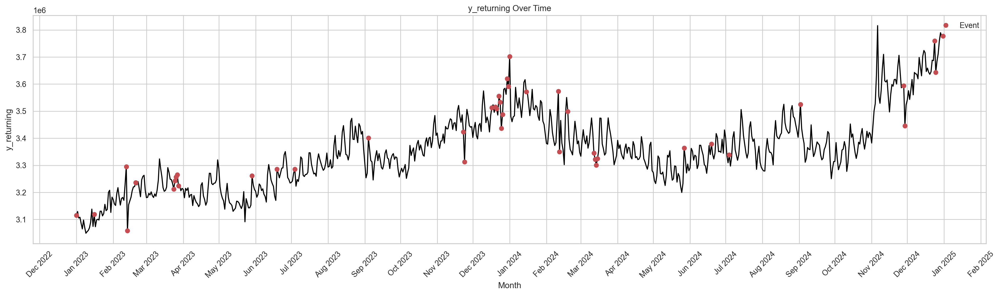

In [6]:
import matplotlib.dates as mdates

# One-hot encode events
event_dummies = pd.get_dummies(raw_df["event"], prefix="event_", prefix_sep="")
event_dummies = (event_dummies >= 1).astype(int)
daily_df = pd.concat([raw_df, event_dummies], axis=1).sort_values("day_dt").reset_index(drop=True)


# One-hot encode dow
dow_dummies = pd.get_dummies(daily_df["day_dt"].dt.dayofweek, prefix="dow_", prefix_sep="")
dow_dummies = (dow_dummies >= 1).astype(int)
daily_df = pd.concat([daily_df, dow_dummies], axis=1)

# Set plot style
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))

# Plot main time series
sns.lineplot(data=daily_df, x="day_dt", y="y_returning", color="black", ax=ax)

# Highlight days with events using red dots
event_days = daily_df[pd.notna(daily_df["event"])]
ax.plot(event_days["day_dt"], event_days["y_returning"], "ro", markersize=6, label="Event")

# Format x-axis to show monthly ticks
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.xticks(rotation=45)

# Labels and title
ax.set(title="y_returning Over Time", xlabel="Month", ylabel="y_returning")
ax.legend()
plt.tight_layout()
plt.show()

In [7]:
# add a linear trend to the data
daily_df['t'] = np.arange(len(daily_df))




In [8]:
daily_df.columns

Index(['day_dt', 'channel_app_imps', 'channel_hmi_audio_imps',
       'channel_hmi_display_imps', 'channel_hmi_linear_imps',
       'channel_hmi_ooh_imps', 'channel_hmi_video_imps',
       'channel_influencer_imps', 'channel_macs_programmatic_imps',
       'channel_macs_social_imps', 'channel_oo_display_imps',
       'channel_oo_linear_imps', 'channel_oo_video_imps',
       'channel_paid_search_imps', 'channel_partnerships_imps',
       'channel_podcast_one_imps', 'channel_app_spend',
       'channel_hmi_audio_spend', 'channel_hmi_display_spend',
       'channel_hmi_linear_spend', 'channel_hmi_ooh_spend',
       'channel_hmi_video_spend', 'channel_influencer_spend',
       'channel_macs_programmatic_spend', 'channel_macs_social_spend',
       'channel_oo_display_spend', 'channel_oo_linear_spend',
       'channel_oo_video_spend', 'channel_paid_search_spend',
       'channel_partnerships_spend', 'channel_podcast_one_spend',
       'y_returning', 'y_new_winback', 'y_total_qdau', 'weekday_

# Specify Variables in the Model

In [9]:


# 1. control variables
# We just keep the holidays columns
control_columns = [col for col in daily_df.columns if col.startswith("event_") or col.startswith("dow_")]
print("Control columns:", control_columns)

# 2. media variables
# Impressions only for now
media_activity = "imps" # must be "imps" or "spend"
channel_columns_raw = sorted(
    [
        col
        for col in daily_df.columns
        if ("channel_" in col) & (f"_{media_activity}" in col)
    ]
)

imps_channel_mapping = {
    "channel_app_imps": "MACS App",
    "channel_hmi_audio_imps": "HMI Audio",
    "channel_hmi_display_imps": "HMI Display",
    "channel_hmi_linear_imps": "HMI Linear",
    "channel_hmi_ooh_imps": "HMI OOH",
    "channel_hmi_video_imps": "HMI Digital Video",
    "channel_influencer_imps": "Influencer",
    "channel_macs_programmatic_imps": "MACS Programmatic",
    "channel_macs_social_imps": "MACS Social",
    "channel_oo_display_imps": "OO Display",
    "channel_oo_linear_imps": "OO Linear",
    "channel_oo_video_imps": "OO Video",
    "channel_paid_search_imps": "Paid Search",
    "channel_partnerships_imps": "Partnerships",
    "channel_podcast_one_imps": "Podcast One Audio",
}



spend_channel_mapping = {
    "channel_app_spend": "MACS App",
    "channel_hmi_audio_spend": "HMI Audio",
    "channel_hmi_display_spend": "HMI Display",
    "channel_hmi_linear_spend": "HMI Linear",
    "channel_hmi_ooh_spend": "HMI OOH",
    "channel_hmi_video_spend": "HMI Digital Video",
    "channel_influencer_spend": "Influencer",
    "channel_macs_programmatic_spend": "MACS Programmatic",
    "channel_macs_social_spend": "MACS Social",
    "channel_oo_display_spend": "OO Display",
    "channel_oo_linear_spend": "OO Linear",
    "channel_oo_video_spend": "OO Video",
    "channel_paid_search_spend": "Paid Search",
    "channel_partnerships_spend": "Partnerships",
    "channel_podcast_one_spend": "Podcast One Audio",
}

if media_activity == "imps":
    channel_mapping = imps_channel_mapping
    channel_columns = sorted(list(imps_channel_mapping.keys()))
    
else:
    channel_mapping = spend_channel_mapping
    channel_columns = sorted(list(spend_channel_mapping.keys()))
    
channel_names = sorted(list(imps_channel_mapping.values()))

print("Channel columns:", channel_names)



# 3. y variable
y_var = "y_new_winback"

data_df = daily_df[["day_dt", y_var, *channel_columns, *control_columns]]
data_df = data_df.rename(columns=channel_mapping)

# reorder the channel columns in data_df only
sorted_channel_columns = sorted(channel_mapping.values())
data_df = data_df[['day_dt', y_var, *sorted_channel_columns, *control_columns]]

# 4. Date column
data_df["day_dt"] = pd.to_datetime(data_df["day_dt"])
date_column = "day_dt"
data_df.columns

# remove event_0 column
if "event_0" in data_df.columns:
    data_df = data_df.drop(columns=["event_0"])

Control columns: ['event_anomaly_12_17_23', 'event_anomaly_12_20_2023', 'event_anomaly_12_21_2023', 'event_anomaly_3_12_2024', 'event_anomaly_3_13_2024', 'event_anomaly_3_14_2024', 'event_anomaly_3_15_2024', 'event_anomaly_3_24_23', 'event_anomaly_3_25_23', 'event_anomaly_3_26_23', 'event_anomaly_3_27_23', 'event_anomaly_3_28_23', 'event_blk_fri_2023', 'event_blk_fri_2024', 'event_day_after_superbowl_2023', 'event_day_after_superbowl_2024', 'event_day_b4_nye_2023', 'event_day_b4_xmas_eve_2023', 'event_ind_2023', 'event_ind_2024', 'event_juneteenth_2023', 'event_juneteenth_2024', 'event_lab_2023', 'event_lab_2024', 'event_mem_2023', 'event_mem_2024', 'event_mlk_2023', 'event_mlk_2024', 'event_ny23_2023', 'event_ny24_2024', 'event_nye_2023', 'event_nye_2024', 'event_pres_2023', 'event_pres_2024', 'event_superbowl_2023', 'event_superbowl_2024', 'event_thanks_2023', 'event_thanks_2024', 'event_xmas_2023', 'event_xmas_2024', 'event_xmas_day_after_2023', 'event_xmas_eve_2023', 'event_xmas_ev

## Specify Time-Slice-Cross-Validation Strategy

The main idea of the time-slice cross validation process is to fit the model on a time slice of the data and then evaluate it on the next time slice. We repeat this process for each time slice of the data. As we want to simulate a production-like environment where we enlarge our training data over time, we make the time-slice size grow over time.

Following the strategy of the example notebook, we use the media share of each channel to set the prior standard deviation of the beta parameters. We need to compute this share for EACH training time slice independently.

```{admonition} Data Leakage
:class: warning

It is very important to avoid data leakage when performing time-slice cross validation. This means that the model should not see any training data from the future. This also includes any data pre-processing steps!

For example, as mentioned above, we need to compute the media share for each training time slice independently if we want to avoid data leakage. Other sources of data leakage include using a global feature for thr trend component. In our case, we simply use an increasing variable `t` so we are safe as we just increase it by one for each time slice.
```

We wrap the main steps of the training procedure in a set of functions.

In [10]:
def compute_sigma_from_costs(
    X: pd.DataFrame, channel_names: list[str]
) -> list[float]:
    """Compute the prior standard deviation of the beta parameters from the activity share of each channel."""
    n_channels = len(channel_names)
    total_activity_per_channel = X[channel_names].sum(axis=0)
    activity_share = total_activity_per_channel / total_activity_per_channel.sum()
    prior_sigma = n_channels * activity_share.to_numpy()
    return prior_sigma.tolist()


def get_mmm(X: pd.DataFrame, channel_names: list[str], control_columns: list[str], date_column: str) -> MMM:
    """Specify the model."""
    prior_sigma = compute_sigma_from_costs(X, channel_names)

    model_config = {
        "intercept": Prior("Normal", mu=0.3, sigma=.1), 
        "saturation_beta": Prior("HalfNormal", sigma=prior_sigma, dims="channel"),
        "gamma_control": Prior("TruncatedNormal", mu=0, sigma=0.07, lower=-0.15, upper=0.15, dims="control"),
    }

    return MMM(
        adstock=GeometricAdstock(l_max=64),
        saturation=LogisticSaturation(),
        date_column=date_column,
        channel_columns=channel_names, # use channel names 
        control_columns=control_columns,
        model_config=model_config,
        time_varying_media=True,
        time_varying_intercept=True,
    )


def fit_mmm(
    mmm: MMM, X: pd.DataFrame, y: pd.Series, random_seed: np.random.Generator
) -> MMM:
    """Fit the model."""
    fit_kwargs = {
        "tune": 250,
        "chains": 4,
        "draws": 250,
        "nuts_sampler": "numpyro",
        "random_seed": random_seed,
    }
    _ = mmm.fit(X, y, progressbar=True, **fit_kwargs)
    _ = mmm.sample_posterior_predictive(
        X, extend_idata=True, combined=True, progressbar=True, random_seed=random_seed
    )
    return mmm

For the sake of convenience, we define a data container to store the results of the time-slice cross validation step.

In [11]:
@dataclass
class TimeSliceCrossValidationResult:
    """Container for the results of the time slice cross validation."""

    X_train: pd.DataFrame
    y_train: pd.Series
    X_test: pd.DataFrame
    y_test: pd.Series
    mmm: MMM
    y_pred_test: pd.Series

Finally, we define the main function that performs the time-slice cross validation step by calling the functions defined above.

In [12]:
def time_slice_cross_validation_step(
    X_train: pd.DataFrame,
    y_train: pd.Series,
    X_test: pd.DataFrame,
    y_test: pd.Series,
    random_seed: np.random.Generator,
) -> TimeSliceCrossValidationResult:
    """Time-slice cross validation step.

    We fit the model on the training data and generate predictions for the test data.

    Parameters
    ----------
    X_train: pd.DataFrame
        Training data.
    y_train: pd.Series
        Training target.
    X_test: pd.DataFrame
        Test data.
    y_test: pd.Series
        Test target.

    Returns
    -------
    TimeSliceCrossValidationResult
        Results of the time slice cross validation step.
    """
    mmm = get_mmm(X_train, channel_names=channel_names, control_columns=control_columns, date_column=date_column)
    
    # Alternative using f-string
    print(f"Configurations for mmm: {pprint.pformat(mmm.model_config)}")
    mmm = fit_mmm(mmm, X_train, y_train, random_seed)

    y_pred_test = mmm.sample_posterior_predictive(
        X_test,
        include_last_observations=True,
        original_scale=True,
        extend_idata=False,
        progressbar=False,
        random_seed=random_seed,
    )

    return TimeSliceCrossValidationResult(
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
        y_test=y_test,
        mmm=mmm,
        y_pred_test=y_pred_test,
    )

We are now ready to run the time-slice cross validation loop 💪!

## Run Time-Slice-Cross-Validation Loop

Depending on the business requirements, we need to decide the initial number of observations to use for fitting the model (`n_init`) and the forecast horizon (`forecast_horizon`). For this example, we use the first 158 observations to fit the model and then predict the next 12 observations (3 months).

In [13]:
# split the data into X and Y

x_columns = [date_column] + channel_names + control_columns

X = data_df.loc[:, x_columns]
print("x:", X.columns)

y = data_df[y_var]

x: Index(['day_dt', 'HMI Audio', 'HMI Digital Video', 'HMI Display', 'HMI Linear',
       'HMI OOH', 'Influencer', 'MACS App', 'MACS Programmatic', 'MACS Social',
       'OO Display', 'OO Linear', 'OO Video', 'Paid Search', 'Partnerships',
       'Podcast One Audio', 'event_anomaly_12_17_23',
       'event_anomaly_12_20_2023', 'event_anomaly_12_21_2023',
       'event_anomaly_3_12_2024', 'event_anomaly_3_13_2024',
       'event_anomaly_3_14_2024', 'event_anomaly_3_15_2024',
       'event_anomaly_3_24_23', 'event_anomaly_3_25_23',
       'event_anomaly_3_26_23', 'event_anomaly_3_27_23',
       'event_anomaly_3_28_23', 'event_blk_fri_2023', 'event_blk_fri_2024',
       'event_day_after_superbowl_2023', 'event_day_after_superbowl_2024',
       'event_day_b4_nye_2023', 'event_day_b4_xmas_eve_2023', 'event_ind_2023',
       'event_ind_2024', 'event_juneteenth_2023', 'event_juneteenth_2024',
       'event_lab_2023', 'event_lab_2024', 'event_mem_2023', 'event_mem_2024',
       'event_mlk_2023

In [63]:
# melt the data_df
melted_df = data_df.melt(
    id_vars=[date_column],
    value_vars=channel_names,
    var_name="channel",
    value_name="impressions",
)

# aggregate impressions by month for each channel
melted_df["month"] = melted_df[date_column].dt.to_period("M")
monthly_impressions = melted_df.groupby(["month", "channel"])["impressions"].sum().reset_index()

display(monthly_impressions)

# write to csv
monthly_impressions.to_csv(data_dir / "monthly_impressions.csv", index=False)

,month,channel,impressions
0,2023-01,HMI Audio,1.749006e+08
1,2023-01,HMI Digital Video,1.045209e+07
2,2023-01,HMI Display,1.754000e+03
3,2023-01,HMI Linear,9.006157e+06
4,2023-01,HMI OOH,7.676037e+06
...,...,...,...
355,2024-12,OO Linear,2.680200e+07
356,2024-12,OO Video,9.548812e+07
357,2024-12,Paid Search,5.147376e+07
358,2024-12,Partnerships,1.545482e+09


In [64]:
monthly_impressions

,month,channel,impressions
0,2023-01,HMI Audio,1.749006e+08
1,2023-01,HMI Digital Video,1.045209e+07
2,2023-01,HMI Display,1.754000e+03
3,2023-01,HMI Linear,9.006157e+06
4,2023-01,HMI OOH,7.676037e+06
...,...,...,...
355,2024-12,OO Linear,2.680200e+07
356,2024-12,OO Video,9.548812e+07
357,2024-12,Paid Search,5.147376e+07
358,2024-12,Partnerships,1.545482e+09


/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/172839320.py:13: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  melted_contrib["month"] = pd.to_datetime(melted_contrib["month"]).dt.to_period("M")
/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/172839320.py:47: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


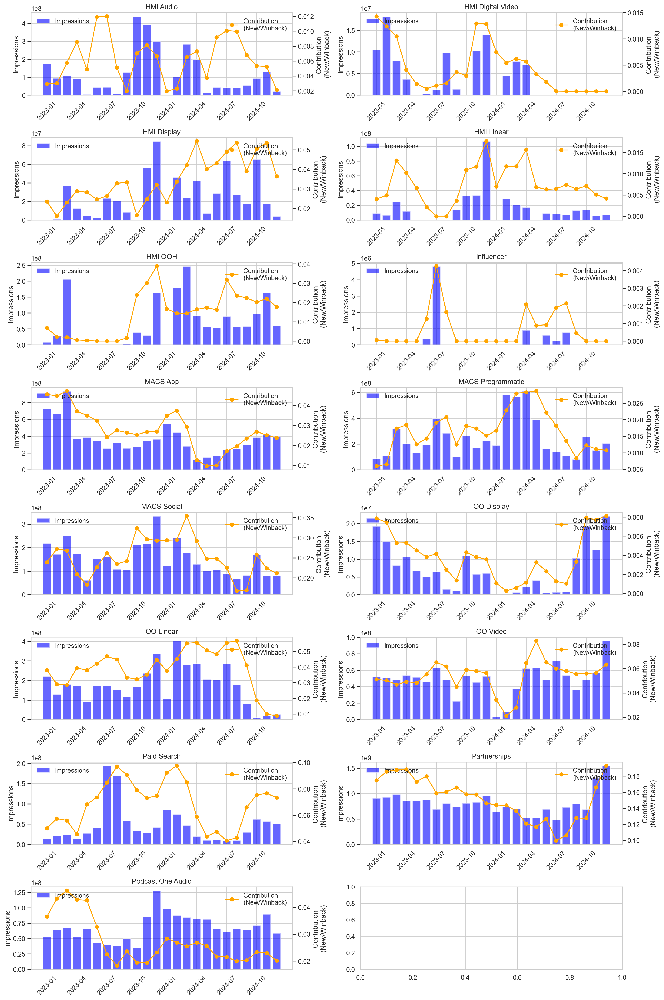

In [101]:
# read in media contributions from deloitte
raw_contrib = pd.read_csv("/Users/shua0225/MMM/monthly_contributions_deloitte.csv")
raw_contrib = raw_contrib.rename(columns={"Month": "month"})

# melt the data
melted_contrib = raw_contrib.melt(
    id_vars=["month"],
    var_name="channel",
    value_name="contribution",
)

# convert month to datetime
melted_contrib["month"] = pd.to_datetime(melted_contrib["month"]).dt.to_period("M")


# join monthly_impressions and melted_contrib
joined = monthly_impressions.merge(
    melted_contrib,
    on=["month", "channel"],
    how="left",
)


# Plot with secondary y-axis for contribution
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(16, 24))
axes = axes.flatten()

for i, channel in enumerate(joined["channel"].unique()):
    channel_data = joined[joined["channel"] == channel]
    axes[i].bar(channel_data["month"].astype(str), channel_data["impressions"], label="Impressions", color="blue", alpha=0.6)
    axes[i].set_ylabel("Impressions")
    axes[i].set_title(channel)
    
    # Create a secondary y-axis for contribution
    ax2 = axes[i].twinx()
    ax2.plot(channel_data["month"].astype(str), channel_data["contribution"], label="Contribution \n(New/Winback)", color="orange", marker='o')
    ax2.set_ylabel("Contribution \n(New/Winback)")
    
    # Set x-axis ticks
    axes[i].set_xticks(channel_data["month"].astype(str)[::3])
    axes[i].set_xticklabels(channel_data["month"].astype(str)[::3], rotation=45)
    axes[i].legend(loc="upper left")
    ax2.legend(loc="upper right")

    # remove the grid lines for the secondary y-axis
    ax2.grid(False)
plt.tight_layout()
plt.show()

/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/3727683988.py:34: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


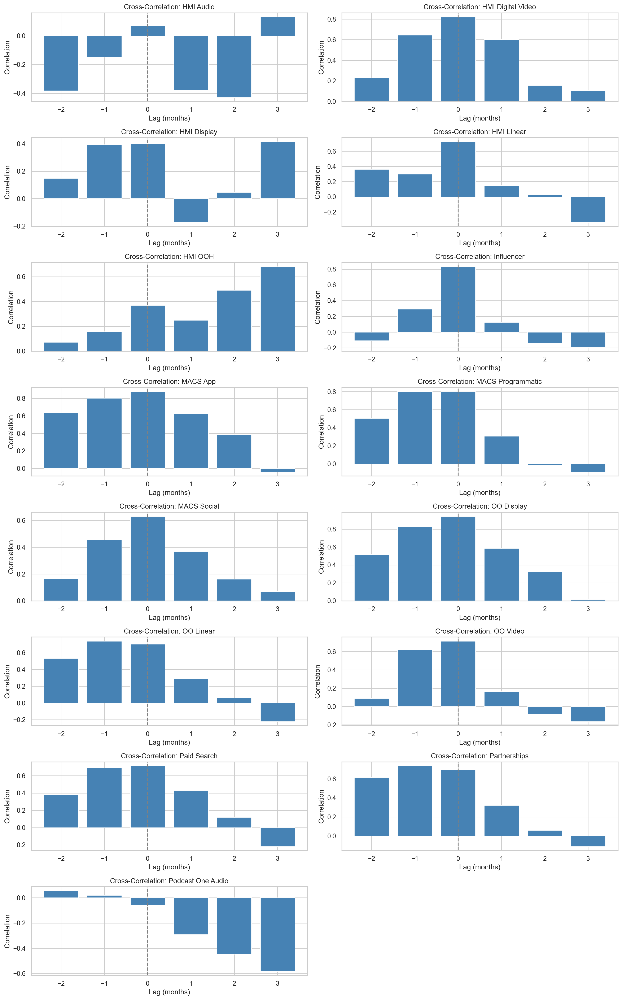

In [93]:
import math

# Determine number of rows needed for 2 plots per row
n_cols = 2
n_rows = math.ceil(len(channel_names) / n_cols)

# Prepare figure with adjusted grid layout
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 3 * n_rows))
axes = axes.flatten()
lags = np.arange(-2, 4, 1)  # Lags from -6 to 6 months

# Plot CCF for each channel
for i, channel in enumerate(channel_names):
    ax = axes[i]
    df_channel = joined[joined["channel"] == channel].copy()

    corrs = []
    for lag in lags:
        shifted = df_channel["impressions"].shift(-lag)
        corr = df_channel["contribution"].corr(shifted)
        corrs.append(corr)

    ax.bar(lags, corrs, color="steelblue")
    ax.axvline(0, color="gray", linestyle="--")
    ax.set_title(f"Cross-Correlation: {channel}")
    ax.set_xlabel("Lag (months)")
    ax.set_ylabel("Correlation")
    ax.grid(True)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/1636157967.py:41: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


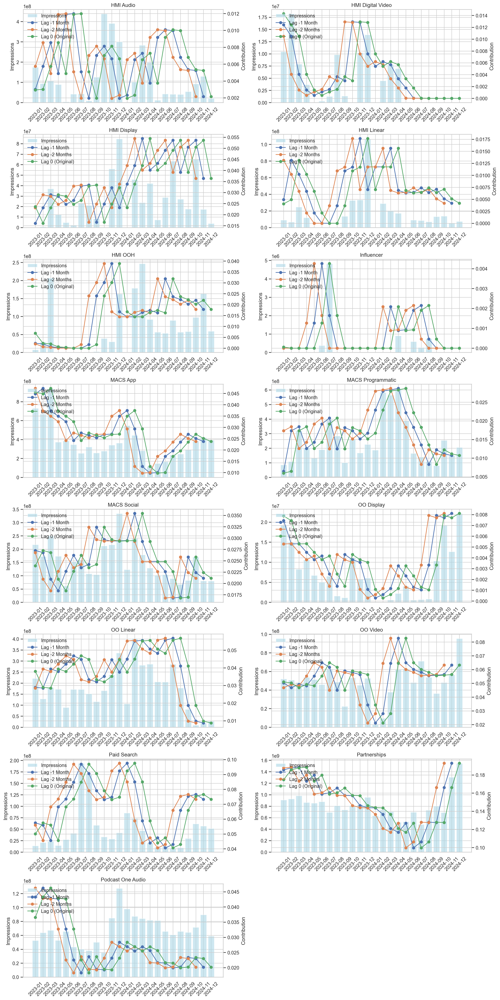

In [97]:
# Prepare subplots manually with secondary y-axis support
import matplotlib.dates as mdates

# Get unique channels
channels = overlay_df["channel"].unique()
n_channels = len(channels)
n_cols = 2
n_rows = (n_channels + 1) // n_cols

# Create subplot grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows), sharex=False)
axes = axes.flatten()

# Plot each channel separately
for i, channel in enumerate(channels):
    ax1 = axes[i]
    data = overlay_df[overlay_df["channel"] == channel]

    # Barplot of impressions
    impressions_data = data.drop_duplicates(subset=["month", "impressions"])
    ax1.bar(impressions_data["month"], impressions_data["impressions"], color="lightblue", alpha=0.6, label="Impressions")
    ax1.set_ylabel("Impressions")
    ax1.set_title(channel)
    ax1.tick_params(axis='x', rotation=45)

    # Lineplot of contribution on secondary y-axis
    ax2 = ax1.twinx()
    for lag_label, lag_data in data.groupby("contrib_lag"):
        ax2.plot(lag_data["month"], lag_data["contribution_value"], marker="o", label=lag_label)
    ax2.set_ylabel("Contribution")
    
    # Legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc="upper left")

# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


/Users/shua0225/pymc-marketing/pymc-marketing/.venv/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


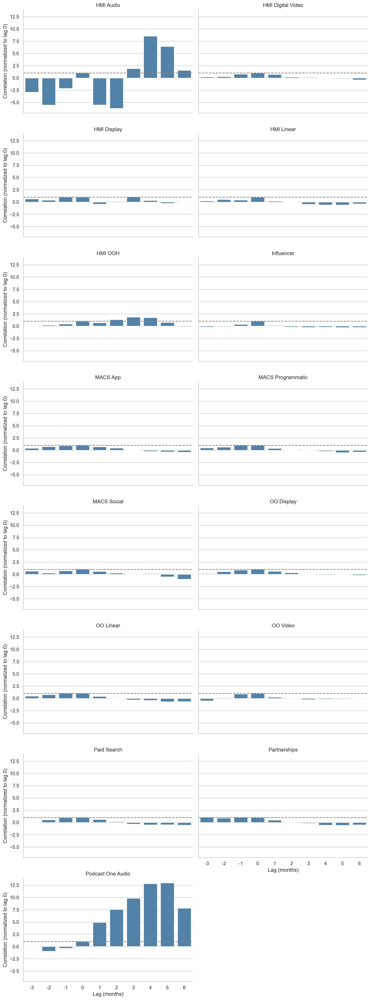

In [92]:
# Calculate cross-correlation curves for each channel and normalize by lag 0

# Store results
ccf_results = []

for channel in channels:
    df_channel = joined[joined["channel"] == channel].copy()
    
    corrs = []
    for lag in lags:
        shifted = df_channel["impressions"].shift(-lag)
        corr = df_channel["contribution"].corr(shifted)
        corrs.append(corr)
    
    # Normalize to lag 0
    lag0_index = lags.index(0)
    lag0_corr = corrs[lag0_index]
    norm_corrs = [c / lag0_corr if lag0_corr != 0 else 0 for c in corrs]
    
    # Store data
    for lag, raw_corr, norm_corr in zip(lags, corrs, norm_corrs):
        ccf_results.append({
            "channel": channel,
            "lag": lag,
            "corr": raw_corr,
            "corr_norm": norm_corr
        })

# Create DataFrame
ccf_df = pd.DataFrame(ccf_results)

# Plot normalized correlation with FacetGrid
g = sns.FacetGrid(
    ccf_df,
    col="channel",
    col_wrap=2,
    height=4,
    aspect=1.5,
    sharex=True,
    sharey=True
)
g.map_dataframe(sns.barplot, x="lag", y="corr_norm", color="steelblue")
g.set_axis_labels("Lag (months)", "Correlation (normalized to lag 0)")
g.set_titles("{col_name}")
for ax in g.axes.flat:
    ax.axhline(1.0, linestyle="--", color="gray")  # lag 0 reference
plt.tight_layout()
plt.show()


In [80]:
joined.to_csv("monthly_impressions_contribution.csv", index=False)

Let's run it! 

In [14]:
import ray
import time

# Initialize Ray
if not ray.is_initialized():
    ray.init(ignore_reinit_error=True)

# Define your forecast horizons per month
n_init = 365
forecast_horizons = {
    "2024-01": 31,
    "2024-02": 29,
    "2024-03": 31,
}
months = list(forecast_horizons.keys())
n_iterations = len(months)

# Ray remote function for CV step
@ray.remote
def run_time_slice_cv(X_train, y_train, X_test, y_test, rng, max_retries=2):
    import traceback
    for attempt in range(max_retries + 1):
        try:
            return time_slice_cross_validation_step(
                X_train=X_train,
                y_train=y_train,
                X_test=X_test,
                y_test=y_test,
                random_seed=rng,
            )
        except Exception as e:
            if attempt < max_retries:
                time.sleep(1)
            else:
                print(f"❌ FAILED: {e}")
                traceback.print_exc()
                return None

# Prepare tasks
futures = []
split_start = n_init
split_indices = []

for i in range(n_iterations):
    month_str = months[i]
    forecast_horizon = forecast_horizons[month_str]
    step_size = forecast_horizon

    train_test_split = split_start

    if train_test_split + forecast_horizon > len(y):
        print(f"⚠️ Skipping iteration {i} ({month_str}) — not enough data")
        continue

    X_train = X.iloc[:train_test_split].copy()
    y_train = y.iloc[:train_test_split].copy()
    X_test = X.iloc[train_test_split : train_test_split + forecast_horizon].copy()
    y_test = y.iloc[train_test_split : train_test_split + forecast_horizon].copy()

    print(f"Forecast horizon: {forecast_horizon} days")
    print(f"Iteration {i} ({month_str})")
    # print training period
    print(f"Training period: {X_train[date_column].min()} to {X_train[date_column].max()}")
    # print testing period
    print(f"Testing period: {X_test[date_column].min()} to {X_test[date_column].max()}")


    future = run_time_slice_cv.remote(
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
        y_test=y_test,
        rng=rng,
    )
    futures.append(future)
    split_indices.append((i, month_str))

    split_start += step_size

# Collect results with tqdm
results = []
for i, future in tqdm(enumerate(futures), total=len(futures), desc="TimeSlice CV"):
    result = ray.get(future)
    if result is not None:
        results.append(result)
    else:
        print(f"⚠️ Skipped result at iteration {split_indices[i][0]}: {split_indices[i][1]}")

2025-05-05 22:18:24,714	INFO worker.py:1852 -- Started a local Ray instance.


Forecast horizon: 31 days
Iteration 0 (2024-01)
Training period: 2023-01-01 00:00:00 to 2023-12-31 00:00:00
Testing period: 2024-01-01 00:00:00 to 2024-01-31 00:00:00
Forecast horizon: 29 days
Iteration 1 (2024-02)
Training period: 2023-01-01 00:00:00 to 2024-01-31 00:00:00
Testing period: 2024-02-01 00:00:00 to 2024-02-29 00:00:00
Forecast horizon: 31 days
Iteration 2 (2024-03)
Training period: 2023-01-01 00:00:00 to 2024-02-29 00:00:00
Testing period: 2024-03-01 00:00:00 to 2024-03-31 00:00:00


TimeSlice CV:   0%|          | 0/3 [00:00<?, ?it/s]

(run_time_slice_cv pid=70970) Configurations for mmm: {'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
(run_time_slice_cv pid=70970)  'gamma_control': Prior("TruncatedNormal", mu=0, sigma=0.07, lower=-0.15, upper=0.15, dims="control"),
(run_time_slice_cv pid=70970)  'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"),
(run_time_slice_cv pid=70970)  'intercept': Prior("Normal", mu=0.3, sigma=0.1),
(run_time_slice_cv pid=70970)  'intercept_tvp_config': HSGPKwargs(m=200, L=None, eta_lam=1.0, ls_mu=5.0, ls_sigma=10.0, cov_func=None),
(run_time_slice_cv pid=70970)  'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)),
(run_time_slice_cv pid=70970)  'media_tvp_config': HSGPKwargs(m=200, L=None, eta_lam=1.0, ls_mu=5.0, ls_sigma=10.0, cov_func=None),
(run_time_slice_cv pid=70970)  'saturation_beta': Prior("HalfNormal", sigma=[1.00281567e+00 4.24811020e-02 1.38084822e-01 1.31174603e-01
(run_time_slice_cv pid=70970)  2.62353923e-01 2.86816551e-03 2.897

Compiling.. :   0%|          | 0/500 [00:00<?, ?it/s]
(run_time_slice_cv pid=70972) 
  0%|          | 0/500 [00:00<?, ?it/s]
(run_time_slice_cv pid=70972) 
Compiling.. :   0%|          | 0/500 [00:00<?, ?it/s]
(run_time_slice_cv pid=70972) 
(run_time_slice_cv pid=70972) 
  0%|          | 0/500 [00:00<?, ?it/s]
(run_time_slice_cv pid=70972) 
(run_time_slice_cv pid=70972) 
Compiling.. :   0%|          | 0/500 [00:00<?, ?it/s]
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 1:   0%|          | 0/500 [00:02<?, ?it/s]
(run_time_slice_cv pid=70972) 
Running chain 2:   0%|          | 0/500 [00:02<?, ?it/s]
(run_time_slice_cv pid=70972) 
(run_time_slice_cv pid=7

Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% -:--:-- / 0:00:00
(run_time_slice_cv pid=70975) Configurations for mmm: {'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'gamma_control': Prior("TruncatedNormal", mu=0, sigma=0.07, lower=-0.15, upper=0.15, dims="control"), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'intercept': Prior("Normal", mu=0.3, sigma=0.1), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'intercept_tvp_config': HSGPKwargs(m=200, L=None, eta_lam=1.0, ls_mu=5.0, ls_sigma=10.0, cov_func=None), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)), [repeated 2x across cluster]
(run_time_slice_cv pid=70975)  'media_tvp_config': HSGPKwargs(m=200, L=None, eta_lam

Running chain 0:  95%|█████████▌| 475/500 [40:04<01:03,  2.54s/it]
(run_time_slice_cv pid=70972) Sampling: [y]
(run_time_slice_cv pid=70975) 
Running chain 1:  95%|█████████▌| 475/500 [40:16<01:00,  2.44s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 3:  90%|█████████ | 450/500 [40:17<02:04,  2.49s/it]
(run_time_slice_cv pid=70970) 
(run_time_slice_cv pid=70970) 
Running chain 0: 100%|██████████| 500/500 [40:38<00:00,  4.88s/it]
(run_time_slice_cv pid=70975) 
Running chain 1: 100%|██████████| 500/500 [40:47<00:00,  4.90s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 3:  95%|█████████▌| 475/500 [40:49<00:53,  2.12s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  60%|██████    | 300/500 [40:54<27:55,  8.38s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 3: 100%|

Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% -:--:-- / 0:00:00
Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:00
(run_time_slice_cv pid=70970) 


(run_time_slice_cv pid=70970) Sampling: [y]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  70%|███████   | 350/500 [42:46<13:01,  5.21s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  75%|███████▌  | 375/500 [43:23<08:30,  4.08s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  80%|████████  | 400/500 [43:57<05:26,  3.27s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  85%|████████▌ | 425/500 [44:33<03:23,  2.72s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  90%|█████████ | 450/500 [45:10<01:56,  2.34s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2:  95%|█████████▌| 475/500 [45:46<00:51,  2.07s/it]
(run_time_slice_cv pid=70975) 
(run_time_slice_cv pid=70975) 
Running chain 2: 100%|██████████| 500/500 [46:23<00:00,  5.57s/it]
(run_time_slice_cv pid=70975) There were 3 divergence

Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% -:--:-- / 0:00:00
Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:00
(run_time_slice_cv pid=70975) 


(run_time_slice_cv pid=70975) Sampling: [y]


## Model Diagnostics

First, we evaluate whether we have any divergences in the model (we can extend the analysis more more model diagnostics).

In [15]:
sum([result.mmm.idata["sample_stats"]["diverging"].sum().item() for result in results])

We have no divergences in the model 😃!

## Evaluate Parameter Stability

Next, we look at the stability of the model parameters. For a good model, these should not change abruptly over time.

- Intercept

/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/1060937957.py:69: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


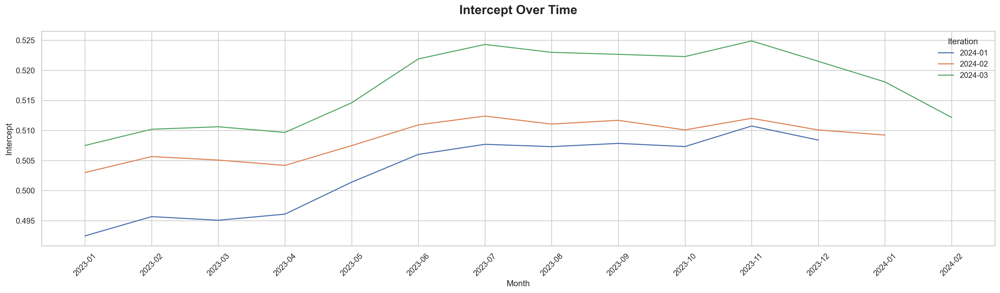

In [16]:

# Initialize an empty DataFrame
records_df = pd.DataFrame()

for month, result in zip(months, results):
    idata = result.mmm.idata
    intercept = idata.posterior["intercept"]  # shape: [chain, draw, time]

    # Stack chain and draw into one dimension → shape: [sample, time]
    intercept_stacked = intercept.stack(sample=("chain", "draw"))

    # Get time dimension name (e.g., "intercept_dim_0")
    time_dim = [dim for dim in intercept_stacked.dims if dim != "sample"][0]
    n_days = intercept_stacked.sizes[time_dim]

    # Get the date associated with the intercept
    start_date = pd.to_datetime(result.X_train[date_column].min())
    time_index = pd.date_range(start=start_date, periods=n_days, freq="D")

    # Create a DataFrame with the time index
    intercept_df = pd.DataFrame(
        intercept_stacked.values, index=time_index, columns=intercept_stacked.coords["sample"].values
    )
    intercept_df = intercept_df.rename_axis("day_dt").reset_index()
    intercept_df["iteration"] = month

    # Melt the DataFrame from wide to long format
    intercept_long = intercept_df.melt(
        id_vars=["day_dt", "iteration"], 
        var_name="sample_id", 
        value_name="intercept"
    )

    # Compute summary stats per month and per month of day_dt
    intercept_long["day_dt"] = pd.to_datetime(intercept_long["day_dt"])
    intercept_long["month_of_day_dt"] = intercept_long["day_dt"].dt.to_period("M").dt.strftime("%Y-%m")
    monthly_summary = (
        intercept_long
        .groupby("month_of_day_dt")["intercept"]
        .agg(["mean", "median", "std"])
        .reset_index()
    )

    monthly_summary["iteration"] = month
    # Calculate the 95% CI
    monthly_summary["lower_ci"] = (
        intercept_long.groupby("month_of_day_dt")["intercept"].quantile(0.025).values
    )
    monthly_summary["upper_ci"] = (
        intercept_long.groupby("month_of_day_dt")["intercept"].quantile(0.975).values
    )

    # Concatenate all monthly summaries into a single DataFrame
    records_df = pd.concat([records_df, monthly_summary], ignore_index=True)

# Display the final DataFrame
#display(records_df)

# Plot the intercepts for each iteration
plt.figure(figsize=(20, 6))
for month in months:
    month_df = records_df[records_df["iteration"] == month]
    plt.plot(month_df["month_of_day_dt"], month_df["mean"], label=month)
   
plt.xticks(rotation=45)
plt.title("Intercept Over Time", fontsize=18, fontweight="bold", y=1.06)
plt.xlabel("Month")
plt.ylabel("Intercept")
plt.legend(title="Iteration")
plt.tight_layout()
plt.show()

- Gamma Control

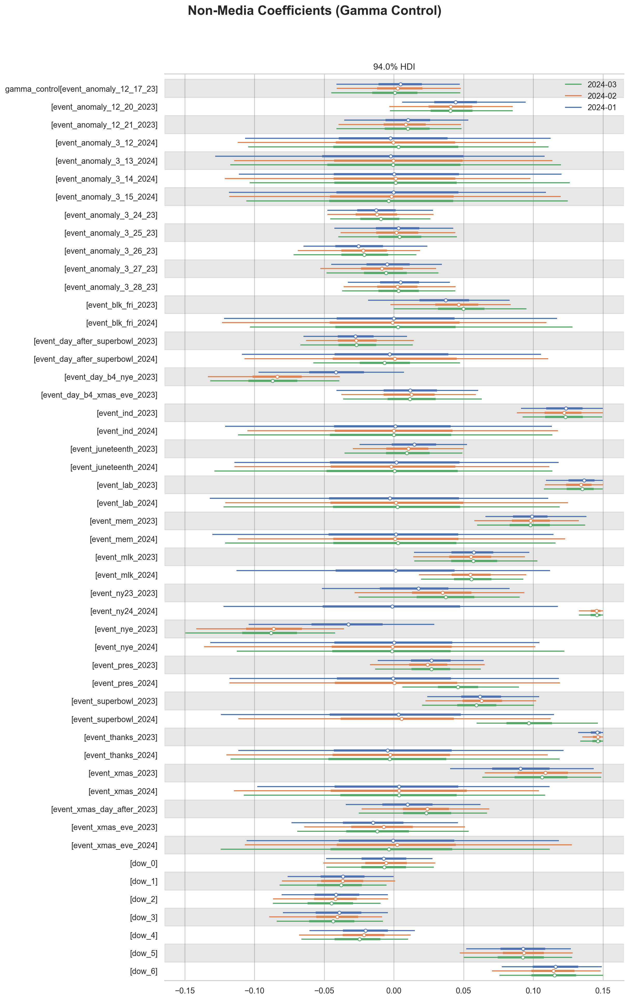

In [17]:
fig, ax = plt.subplots(figsize=(12, 18))

az.plot_forest(
    data=[result.mmm.idata["posterior"] for result in results],
    model_names=[f"{i}" for i in months],
    var_names=["gamma_control"],
    combined=True,
    ax=ax,
)
fig.suptitle("Non-Media Coefficients (Gamma Control)", fontsize=18, fontweight="bold", y=1.06);

- Adstock Alpha

Text(0.5, 0, 'Alpha (Low=faster decay, High = slower decay)')

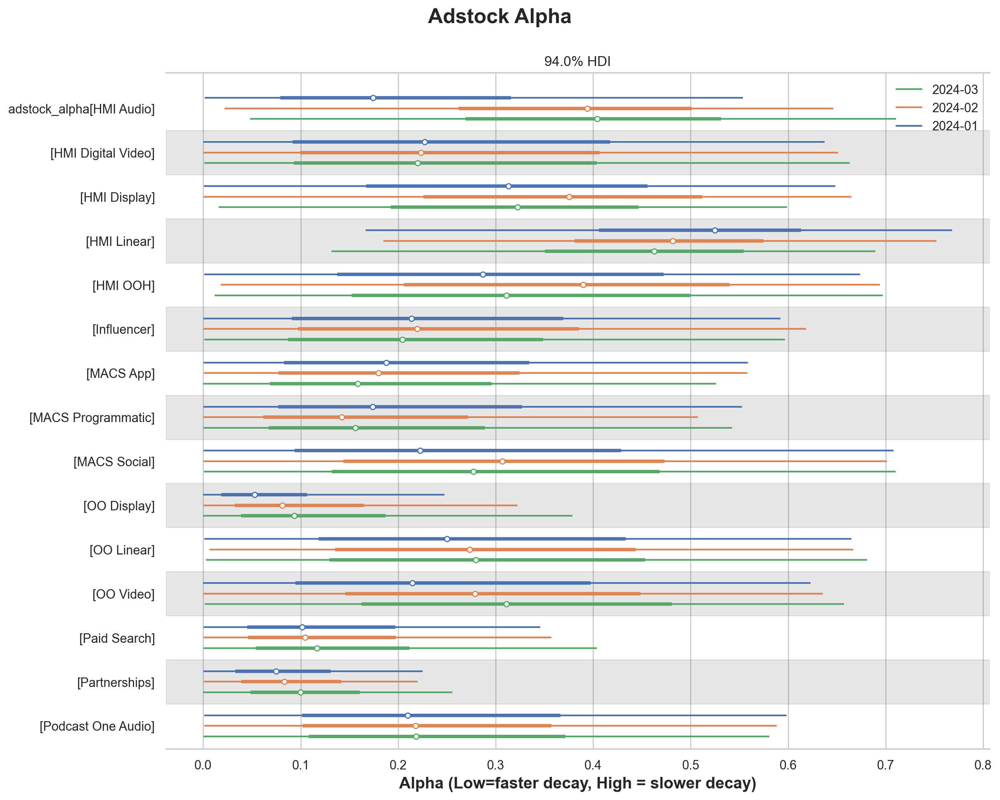

In [18]:
fig, ax = plt.subplots(figsize=(12, 9))

az.plot_forest(
    data=[result.mmm.idata["posterior"] for result in results],
    model_names=[f"{i}" for i in months],
    var_names=["adstock_alpha"],
    combined=True,
    ax=ax,
)
fig.suptitle("Adstock Alpha", fontsize=18, fontweight="bold", y=1.06);
# label x-axis as "Adstock Alpha"
ax.set_xlabel("Alpha (Low=faster decay, High = slower decay)", fontsize=14, fontweight="bold")

# double check whether this is theta 
#A higher ( \alpha ) results in a slower decay of media effects, leading to higher cumulative adstock values.
#A lower ( \alpha ) results in a faster decay, leading to lower cumulative adstock values.

- Saturation Beta

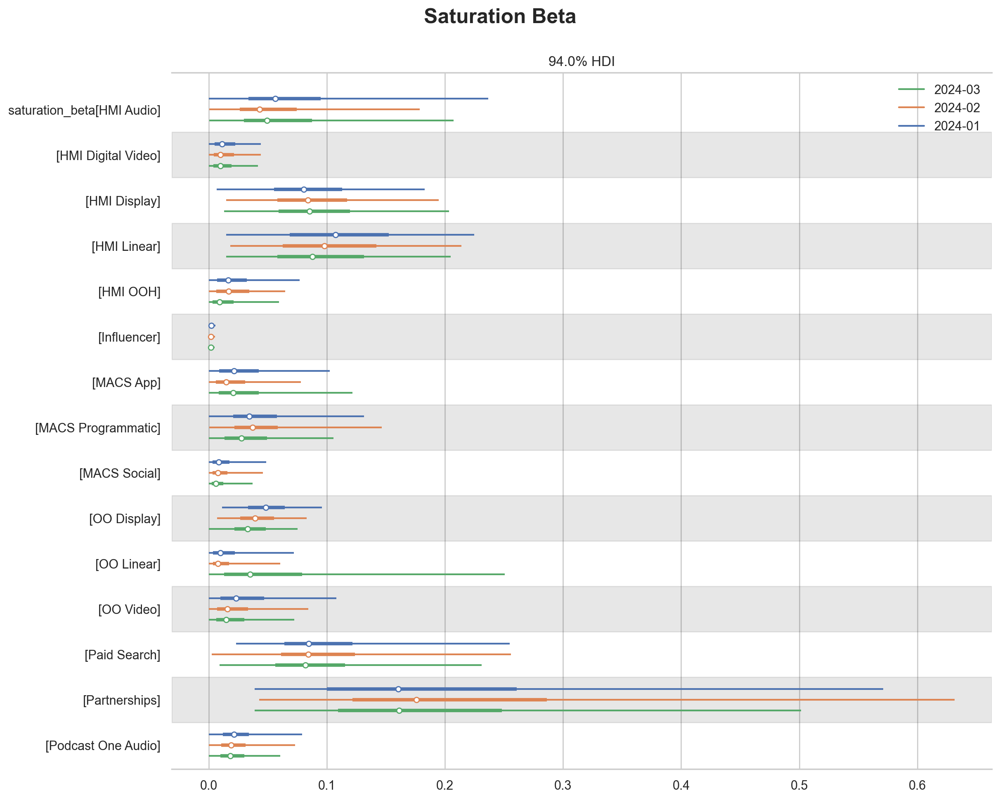

In [19]:
fig, ax = plt.subplots(figsize=(12, 9))

az.plot_forest(
    data=[result.mmm.idata["posterior"] for result in results],
    model_names=[f"{i}" for i in months],
    var_names=["saturation_beta"],
    combined=True,
    ax=ax,
)
fig.suptitle("Saturation Beta", fontsize=18, fontweight="bold", y=1.06);

#High ( \beta ): Media effectiveness drops off quickly after reaching the saturation point, indicating that additional spend or impressions beyond a certain level have little incremental effect.
# Low ( \beta ): Media effectiveness decreases more gradually, allowing for a smoother decline in returns as spend or impressions increase.

- Saturation Lambda

Text(0.5, 0, 'Lambda (Low = fast saturation, High = slow saturation)')

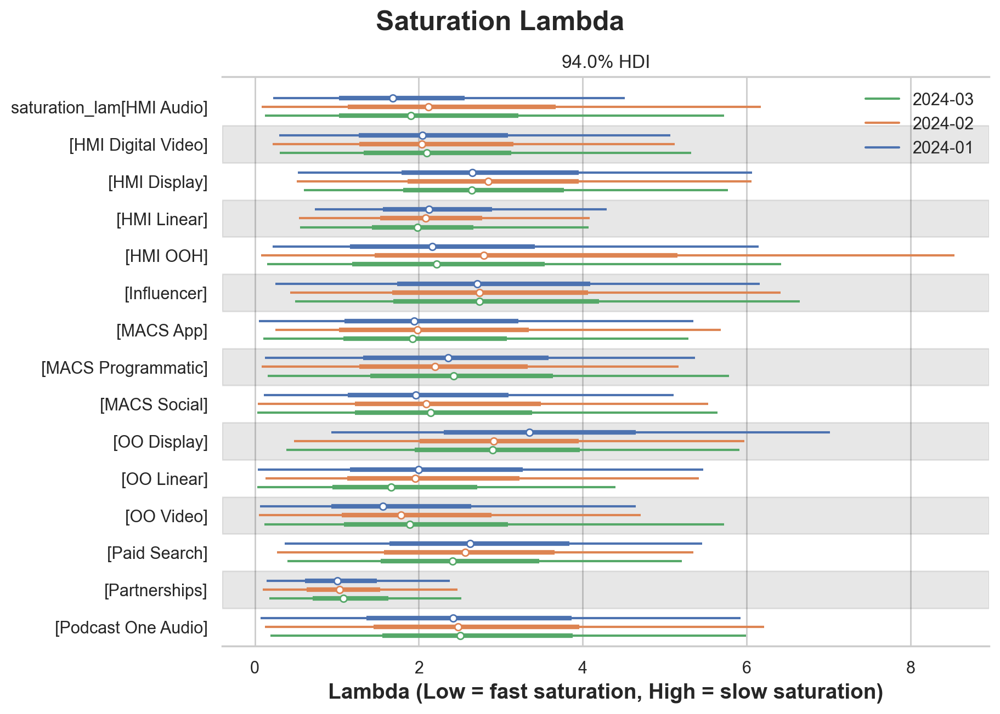

In [20]:
fig, ax = plt.subplots(figsize=(9, 6))

az.plot_forest(
    data=[result.mmm.idata["posterior"] for result in results],
    model_names=[f"{i}" for i in months],
    var_names=["saturation_lam"],
    combined=True,
    ax=ax,
)
fig.suptitle("Saturation Lambda", fontsize=18, fontweight="bold", y=1.06);
# label x-axis as "Saturation Lambda"
ax.set_xlabel("Lambda (Low = fast saturation, High = slow saturation)", fontsize=14, fontweight="bold")

# If ( \lambda ) is small, the media channel saturates quickly, meaning additional spend or impressions beyond a certain point will have little incremental effect.
# If ( \lambda ) is large, the media channel can sustain higher levels of spend or impressions before experiencing diminishing returns.

The parameters seem to be stable over time. This implies that the estimates ROAS will not change abruptly over time.

Let's look at contribution of each channel to the total spend for each iteration

## Evaluate Out of Sample Predictions

Finally, we evaluate the out of sample predictions. To begin with, we can simply plot the posterior predictive distributions for each iteration for both the training and test data.

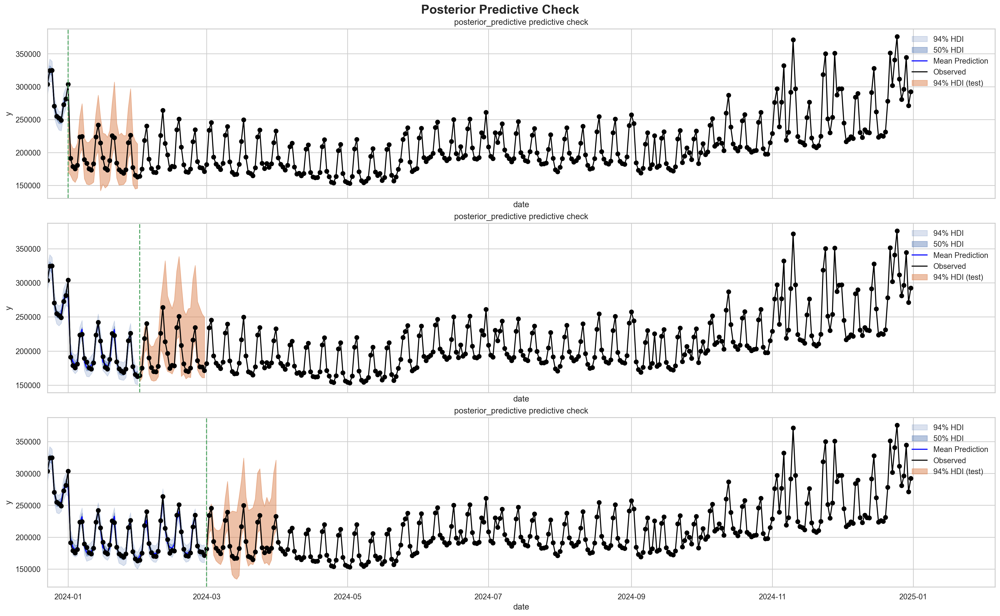

In [21]:
fig, axes = plt.subplots(
    nrows=n_iterations,
    ncols=1,
    figsize=(20, 12),
    sharex=True,
    sharey=False,
    layout="constrained",
)

axes = axes.ravel()

for i, result in enumerate(results):
    ax = axes[i]
    result.mmm.plot_posterior_predictive(original_scale=True, ax=ax)

    hdi_prob = 0.94
    test_hdi = az.hdi(result.y_pred_test["y"].to_numpy().T, hdi_prob=hdi_prob)

    ax.fill_between(
        result.X_test[date_column],
        test_hdi[:, 0],
        test_hdi[:, 1],
        color="C1",
        label=f"{hdi_prob:.0%} HDI (test)",
        alpha=0.5,
    )
    ax.plot(X[date_column], y, marker="o", color="black")
    ax.axvline(result.X_test[date_column].iloc[0], color="C2", linestyle="--")
    ax.legend(loc="upper right")

axes[-1].set(xlim=(X[date_column].iloc[n_init - 9], None))
fig.suptitle("Posterior Predictive Check", fontsize=18, fontweight="bold", y=1.02);

Overall, the out of sample predictions look very good 🚀!

We can quantify the model performance using the Continuous Ranked Probability Score (CRPS).

> *“The CRPS — Continuous Ranked Probability Score — is a score function that compares a single ground truth value to a Cumulative Distribution Function. It can be used as a metric to evaluate a model’s performance when the target variable is continuous and the model predicts the target’s distribution; Examples include Bayesian Regression or Bayesian Time Series models.”*


For a nice explanation of the CRPS, check out this [blog post](https://towardsdatascience.com/crps-a-scoring-function-for-bayesian-machine-learning-models-dd55a7a337a8).

In PyMC Marketing, we provide the function {func}`crps <pymc_marketing.metrics.crps>` to compute this metric. We can use it to compute the CRPS score for each iteration.

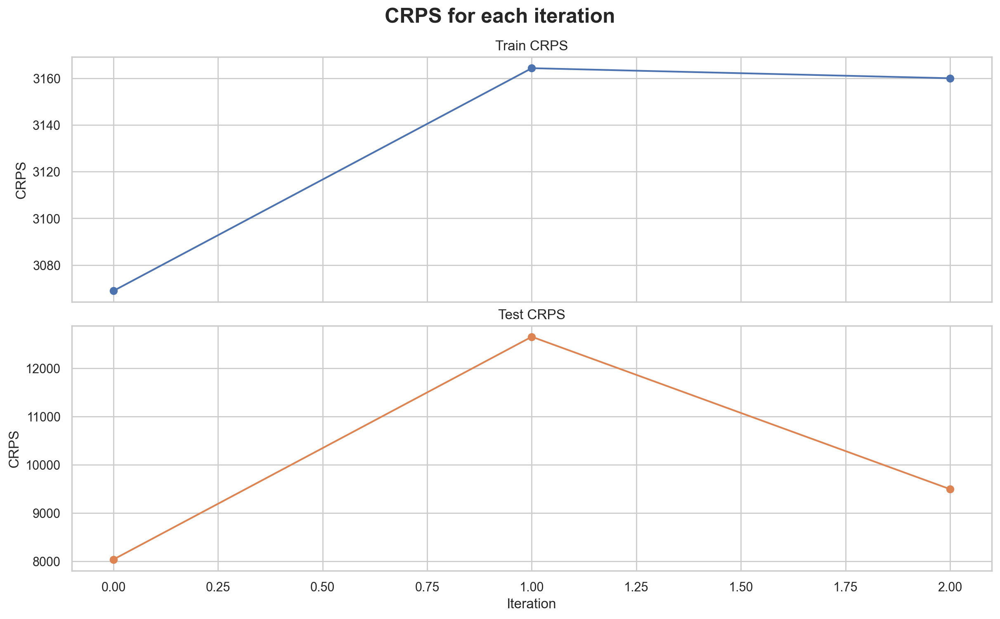

In [22]:
crps_results_train: list[float] = [
    crps(
        y_true=result.y_train.to_numpy(),
        y_pred=az.extract(
            # Scale the predictions back to the original scale
            apply_sklearn_transformer_across_dim(
                data=result.mmm.idata.posterior_predictive["y"],
                func=result.mmm.get_target_transformer().inverse_transform,
                dim_name="date",
            )
        )["y"]
        .to_numpy()
        .T,
    )
    for result in results
]


crps_results_test: list[float] = [
    crps(
        y_true=result.y_test.to_numpy(),
        y_pred=result.y_pred_test["y"].to_numpy().T,
    )
    for result in results
]

fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(12, 7), sharex=True, sharey=False, layout="constrained"
)

ax[0].plot(crps_results_train, marker="o", color="C0", label="train")
ax[0].set(ylabel="CRPS", title="Train CRPS")
ax[1].plot(crps_results_test, marker="o", color="C1", label="test")
ax[1].set(xlabel="Iteration", ylabel="CRPS", title="Test CRPS")
fig.suptitle("CRPS for each iteration", fontsize=18, fontweight="bold", y=1.05);

Event though the visual results look great, we see that the CRPS mildly decreases for the training data while it increases for the test data as we increase the size of the training data. This is a sign that we are overfitting the model to the training data. Some strategies to overcome this issue include using regularization techniques and re-evaluate the model specification. This should be an iterative process.

# Contributions

In [23]:
contributions_by_fold = []

all_contributions = pd.DataFrame()

for i, result in enumerate(results):
    result.X_test["day_dt"]
    # Convert xarray.DataArray to pandas DataFrame
    contributions = result.mmm.compute_channel_contribution_original_scale()
    contributions["fold"] = i + 1
    contributions["n"] = len(contributions)
    contributions["month"] = result.X_test["day_dt"].iloc[0].strftime("%Y-%m")
    print(contributions)



<xarray.DataArray (chain: 4, draw: 250, date: 365, channel: 15)> Size: 44MB
array([[[[4.99742971e+03, 5.12004738e-01, 2.18122550e+00, ...,
          3.04521092e+03, 1.27833551e+04, 5.49092116e+03],
         [6.23502631e+03, 1.17827109e-01, 7.93402054e-01, ...,
          2.37663017e+03, 1.91585414e+04, 9.66566020e+02],
         [5.80941789e+03, 3.53512367e-02, 6.04769748e-01, ...,
          1.72709252e+03, 1.38539721e+04, 2.23229257e+02],
         ...,
         [9.76942830e+03, 3.65586639e+02, 1.71539480e+03, ...,
          5.79961408e+03, 6.21773459e+03, 7.66969054e+03],
         [9.20571528e+03, 2.63918677e+02, 1.26315870e+03, ...,
          5.00121845e+03, 1.01034293e+04, 7.22713605e+03],
         [8.47422420e+03, 1.91080779e+02, 7.63586934e+02, ...,
          5.97603024e+03, 1.09543092e+04, 6.65286394e+03]],

        [[3.01994349e+04, 3.07116361e+00, 6.69615128e-01, ...,
          2.78829852e+03, 1.49584205e+04, 1.41751083e+04],
         [2.76743085e+04, 2.27090097e-01, 5.64009032e-

In [24]:
def plot_waterfall_components_decomposition_across_folds(
    results: list,
    original_scale: bool = True,
    figsize: tuple[int, int] = (14, 7),
    drop_components: list[str] = None,
    stack_per_fold: bool = False,
    **kwargs,
) -> plt.Figure:
    """
    Creates a waterfall chart from cross-validated model contributions.

    Parameters
    ----------
    results : list
        List of TimeSliceCrossValidationResult objects.
    original_scale : bool, optional
        Whether to use the original target scale. Default is True.
    figsize : tuple[int, int], optional
        Figure size. Default is (14, 7).
    drop_components : list[str], optional
        List of components to drop (e.g., intercept, trend).
    stack_per_fold : bool, optional
        If True, show one bar per fold per component (stacked bar style).
        If False, show one average bar per component (classic waterfall).
    **kwargs
        Additional matplotlib options.

    Returns
    -------
    fig : matplotlib.figure.Figure
        The resulting figure.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    # Collect contributions from all folds
    fold_contribs = []

    for i, result in enumerate(results):
        df = result.mmm.compute_mean_contributions_over_time(original_scale=original_scale)
        df = result.mmm._process_decomposition_components(df)
        df["fold"] = f"Fold {i+1}"
        fold_contribs.append(df)

    combined = pd.concat(fold_contribs)

    if drop_components:
        combined = combined[~combined["component"].isin(drop_components)]

    if stack_per_fold:
        # Pivot: components as rows, folds as columns
        pivot = combined.pivot_table(index="component", columns="fold", values="contribution", fill_value=0)

        # Sort by total contribution across folds
        pivot["total"] = pivot.sum(axis=1)
        pivot = pivot.sort_values("total", ascending=False).drop(columns="total")

        fig, ax = plt.subplots(figsize=figsize, layout="constrained", **kwargs)
        bottom = np.zeros(len(pivot))

        for fold in pivot.columns:
            ax.barh(
                pivot.index,
                pivot[fold],
                left=bottom,
                label=fold,
                alpha=0.7,
            )
            bottom += pivot[fold].values

        ax.set_title("Stacked Waterfall: Contributions by Fold")
        ax.set_xlabel("Cumulative Contribution")
        ax.set_ylabel("Components")
        ax.legend(loc="upper right")
        ax.invert_yaxis()

    else:
        # Average contributions across folds
        avg_contribs = (
            combined.groupby("component", as_index=False)["contribution"]
            .mean()
            .sort_values(by="contribution", ascending=False)
        )
        total_contribution = avg_contribs["contribution"].sum()
        avg_contribs["percentage"] = avg_contribs["contribution"] / total_contribution * 100

        fig, ax = plt.subplots(figsize=figsize, layout="constrained", **kwargs)
        cumulative_contribution = 0

        for _, row in avg_contribs.iterrows():
            color = "C0" if row["contribution"] >= 0 else "C3"

            bar_start = (
                cumulative_contribution + row["contribution"]
                if row["contribution"] < 0
                else cumulative_contribution
            )

            ax.barh(
                row["component"],
                row["contribution"],
                left=bar_start,
                color=color,
                alpha=0.5,
            )

            if row["contribution"] > 0:
                cumulative_contribution += row["contribution"]

            label_pos = bar_start + (row["contribution"] / 2)
            if row["contribution"] < 0:
                label_pos = bar_start - (row["contribution"] / 2)

            ax.text(
                label_pos,
                row["component"],
                f"{row['contribution']:,.0f}\n({row['percentage']:.1f}%)",
                ha="center",
                va="center",
                color="black",
                fontsize=10,
            )

        ax.set_title("Average Waterfall: Component Contributions Across Folds")
        ax.set_xlabel("Cumulative Contribution")
        ax.set_ylabel("Components")

        xticks = np.linspace(0, total_contribution, num=11)
        xticklabels = [f"{(x / total_contribution) * 100:.0f}%" for x in xticks]
        ax.set_xticks(xticks)
        ax.set_xticklabels(xticklabels)
        ax.invert_yaxis()

    # Final cleanup
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["left"].set_visible(False)

    return fig


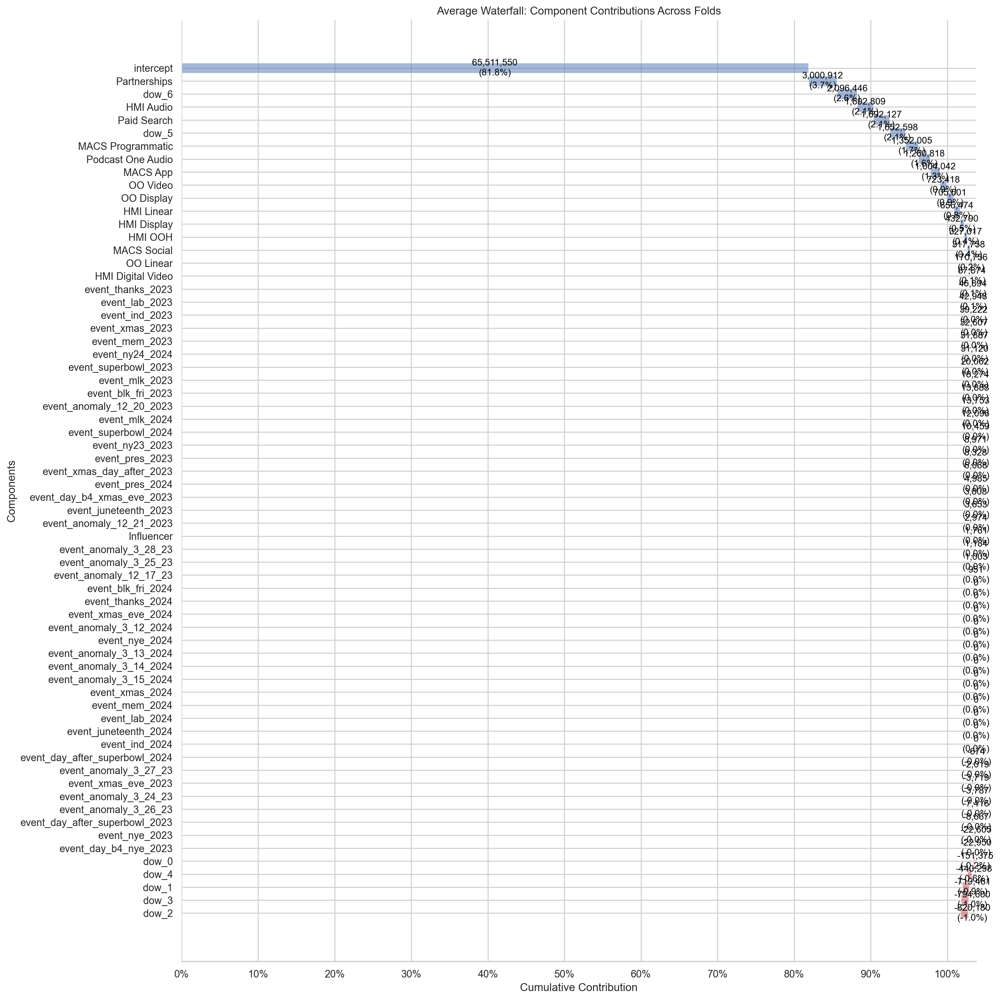

In [25]:
fig = plot_waterfall_components_decomposition_across_folds(results)
# change fig size
fig.set_size_inches(15, 15)

In [26]:
def plot_grouped_contribution_breakdown_over_time_across_folds(
    results: list,
    stack_groups: dict[str, list[str]] | None = None,
    original_scale: bool = False,
    area_kwargs: dict[str, Any] | None = None,
    **plt_kwargs: Any,
) -> plt.Figure:
    """
    Plot a time series area chart for average channel contributions across CV folds.

    Parameters
    ----------
    results : list
        List of TimeSliceCrossValidationResult objects.
    stack_groups : dict of {str: list of str}, optional
        Specifies which variables to group together. If None, no grouping is applied.
    original_scale : bool, by default False
        Whether to use the original target scale.
    area_kwargs : dict, optional
        Additional arguments for pandas `plot.area()`.
    **plt_kwargs : dict
        Additional arguments for matplotlib `plt.subplots()`.

    Returns
    -------
    plt.Figure
        Matplotlib figure with the area plot.
    """
    import matplotlib.pyplot as plt
    import pandas as pd

    # Step 1: Collect contributions over time from each fold
    all_folds = []
    for result in results:
        contrib = result.mmm.compute_mean_contributions_over_time(original_scale=original_scale).copy()
        contrib["date"] = result.X_train["day_dt"].values
        contrib.set_index("date", inplace=True)
        all_folds.append(contrib)

    # Step 2: Concatenate and average over folds
    combined = pd.concat(all_folds)
    avg_contributions = combined.groupby(combined.index).mean().sort_index()

    # Step 3: Apply grouping if provided
    if stack_groups is not None:
        grouped_list = []
        for group_name, columns in stack_groups.items():
            group_series = avg_contributions.filter(columns).sum(axis=1).rename(group_name)
            grouped_list.append(group_series)

        avg_contributions = pd.concat(grouped_list, axis=1)
        # Remove components that are all zeros (e.g., never active in test folds)

    # Step 4: Plot
    fig, ax = plt.subplots(**plt_kwargs)
    area_params = dict(stacked=True, ax=ax)

    # Separate positive and negative parts
    pos_contrib = avg_contributions.clip(lower=0).replace(0, np.nan)
    neg_contrib = avg_contributions.clip(upper=0).replace(0, np.nan)
    print(pos_contrib)
    

    # Final default plot args
    plot_area_kwargs = {"stacked": True, "ax": ax, "legend": False}
    if area_kwargs:
        # Override or extend
        plot_area_kwargs.update(area_kwargs)

    # Plot both
    pos_contrib.plot.area(**plot_area_kwargs)
    neg_contrib.plot.area(**plot_area_kwargs)
    # Re-add legend
    from matplotlib.patches import Patch

    # Get actual line/patch handles and labels
    handles, labels = ax.get_legend_handles_labels()
    label_to_handle = dict(zip(labels, handles))

    # Positive (original) handles
    ordered_labels = list(avg_contributions.columns)
    ordered_handles = [label_to_handle[lbl] for lbl in ordered_labels if lbl in label_to_handle]

    # Step 1: Get consistent color palette
    n = len(avg_contributions.columns)
    color_cycle = plt.rcParams["axes.prop_cycle"].by_key()["color"][:n]
    color_map = dict(zip(avg_contributions.columns, color_cycle))

    # Step 2: Manually build patches
    final_handles = []
    final_labels = []

    for col in avg_contributions.columns:
        # Positive patch
        final_handles.append(Patch(facecolor=color_map[col], label=col, alpha=0.8))
        final_labels.append(col)

        # Negative patch (only if negative values exist)
        if (avg_contributions[col] < 0).any():
            final_handles.append(Patch(facecolor=color_map[col], label=f"{col} (Negative)", alpha=0.4))
            final_labels.append(f"{col} (Negative)")

    # Step 3: Add legend
    ax.legend(
        handles=final_handles,
        labels=final_labels,
        title="Groups" if stack_groups else "Channels",
        loc="center left",
        bbox_to_anchor=(1, 0.5)
    )
    ax.set_title("Average Contributions Over Time Across Folds")
    ax.set_xlabel("Date")
    ax.set_ylabel("Contribution")

    # Set major ticks at the start of each month
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))  # e.g., Jan 2024

    # Set limits to avoid clipping
    ax.set_xlim(avg_contributions.index.min(), avg_contributions.index.max())

    # Set y-axis limits
    ax.set_ylim(bottom=125000, top=300000)

    # Improve label spacing/rotation
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    return fig


                Intercept  Day of Week Seasonality  Linear Trend       Events  \
date                                                                            
2023-01-01  165212.684071             36785.294564           NaN  8970.873811   
2023-01-02  164965.807666                      NaN           NaN          NaN   
2023-01-03  164577.415150                      NaN           NaN          NaN   
2023-01-04  164094.972208                      NaN           NaN          NaN   
2023-01-05  163590.206984                      NaN           NaN          NaN   
...                   ...                      ...           ...          ...   
2024-02-25  165243.615578             36874.863850           NaN          NaN   
2024-02-26  165298.042089                      NaN           NaN          NaN   
2024-02-27  165416.887218                      NaN           NaN          NaN   
2024-02-28  165585.256432                      NaN           NaN          NaN   
2024-02-29  165781.087782   

/Users/shua0225/pymc-marketing/pymc-marketing/.venv/lib/python3.11/site-packages/pandas/plotting/_matplotlib/core.py:1800: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)


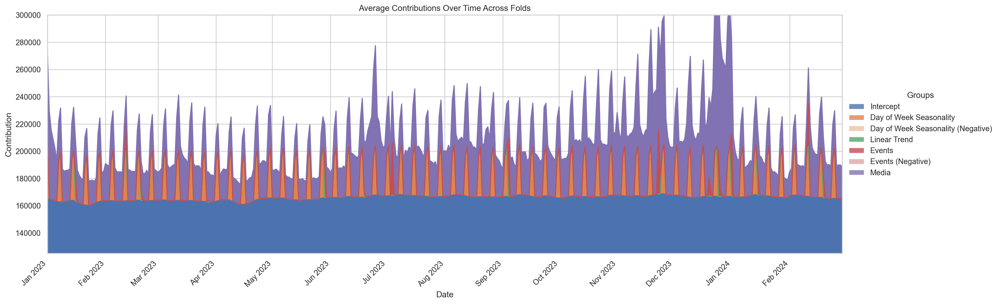

In [27]:
fig = plot_grouped_contribution_breakdown_over_time_across_folds(
    results=results,
    original_scale=True,
    stack_groups={
        "Intercept": ['intercept'],
        "Day of Week Seasonality": [col for col in control_columns if col.startswith("dow_")],
        "Linear Trend": ['t'],
        "Events": [col for col in control_columns if col.startswith("event_")],
        "Media": channel_names
    },
    figsize=(20, 6)
)


/var/folders/kp/4w7zhccj5y15dty978bdp_1r0000gp/T/ipykernel_70511/759621721.py:14: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


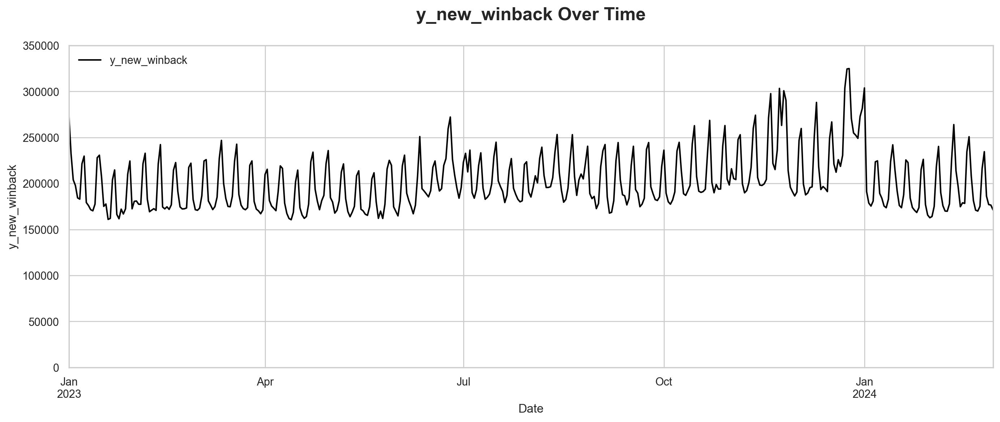

In [28]:
# plot area chart for y_var over time

fig, ax = plt.subplots(figsize=(14, 6))
data_df.set_index("day_dt")[y_var].plot(ax=ax, color="black", label=y_var)
ax.set_title(f"{y_var} Over Time", fontsize=18, fontweight="bold", y=1.06)
ax.set_xlabel("Date")
ax.set_ylabel(y_var)
ax.legend(loc="upper left")
ax.set_ylim(bottom=0, top=350000)
ax.set_xlim(
    left=data_df["day_dt"].min(),
    right=X_train["day_dt"].max(),
)
plt.tight_layout()
plt.show()